# Original TinyGAN demo.ipynb *
Sections from the original TinyGAN demo.ipynb from the TinyGAN github repo marked with "*"

## Set-up *

In [ ]:
!git clone https://github.com/terarachang/ACCV_TinyGAN

fatal: destination path 'ACCV_TinyGAN' already exists and is not an empty directory.


In [ ]:
cd ACCV_TinyGAN

/content/ACCV_TinyGAN


/content/ACCV_TinyGAN


In [ ]:
import torch
import numpy as np
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## Load the trained generator *

In [ ]:
from model import Generator
G = Generator(image_size=128, conv_dim=32, z_dim=128, c_dim=128, repeat_num=5)

In [ ]:
from utils import *
restore_model(30, 'gan/models', G, None, None, None)

The trained models from gan/models/model_30.tar are loaded !


In [ ]:
G.to(device)
G.eval()

Generator(
  (embeding): Embedding(1000, 128)
  (fc): Linear(in_features=128, out_features=8192, bias=True)
  (blocks): Sequential(
    (0): GBlock(
      (dw_conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=512)
      (dw_conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=512)
      (pw_conv1): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
      (pw_conv2): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
      (c_sc): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
      (cbn0): CBN2d(
        (bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
        (embed): Linear(in_features=128, out_features=1024, bias=True)
      )
      (cbn1): CBN2d(
        (bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
        (embed): Linear(in_features=128, out_features=1024, bias=True)
      )
    )
    (1): GBlock(
      (dw_conv1): Conv2d(512, 512,

In [ ]:
def print_network(model):
    """Print out the network information."""
    num_params = 0
    for p in model.parameters():
        num_params += p.numel()
    #print(model)
    print("The number of parameters: {:.1f} M, ({})".format(num_params/10**6, num_params))
    
print_network(G)

The number of parameters: 3.1 M, (3070659)


## Sample y, z *

In [ ]:
z_dim = 128
n_row = 5
n_samples = n_row * n_row
noise = torch.FloatTensor(truncated_normal(n_samples*z_dim)) \
										.view(n_samples, z_dim).to(device)

label = np.random.choice(398, n_row, replace=False) # sample from all animal classes
label = torch.tensor(label).repeat(n_row).to(device)
print(label.view(n_row, n_row))
print(noise.shape)
print(label.shape)

tensor([[356, 137, 193, 188, 138],
        [356, 137, 193, 188, 138],
        [356, 137, 193, 188, 138],
        [356, 137, 193, 188, 138],
        [356, 137, 193, 188, 138]], device='cuda:0')
torch.Size([25, 128])
torch.Size([25])


## G(y, z) *

In [ ]:
with torch.no_grad():
  out = G(noise, label).detach().cpu()

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


## Save & Show the generated image *

In [ ]:
from torchvision.utils import save_image
save_image(denorm(out), 'demo.png', nrow=n_row)

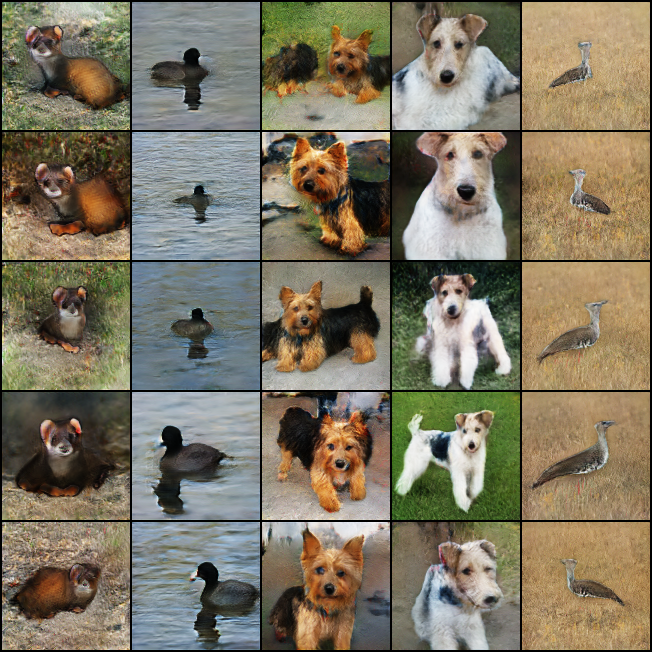

In [ ]:
from IPython.display import Image
Image(filename='demo.png') 

# Pruning Experiments!
The code below is all original for this project. We build off of the TinyGAN setup to prune at various depths across 2 pruning methods.

In this project we will be implementing 1-shot pruning, using layerwise and global pruning methods and at various prune percentages.

In [ ]:
import torchvision
import torch
from torch import nn
import torch.nn.utils.prune as prune
import torch.nn.functional as F
from torchvision.utils import save_image
from IPython.display import Image
import matplotlib.pyplot as plt
from model import Generator


In [ ]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def prune_model_l1_structured(model, layer_type, proportion):
    for module in model.enc.modules():
        if isinstance(module, layer_type):
            prune.ln_structured(module, 'weight', proportion, n=1, dim=1)
            prune.remove(module, 'weight')
    return model

In [ ]:
def prune_model_l1_unstructured(model, layer_type, proportion):
    for module in model.modules():
        if isinstance(module, layer_type):
            prune.l1_unstructured(module, 'weight', proportion)
            prune.remove(module, 'weight')
    return model

In [ ]:
def prune_model_global_unstructured(model, layer_type, proportion):
    module_tups = []
    for module in model.modules():
        if isinstance(module, layer_type):
            module_tups.append((module, 'weight'))

    prune.global_unstructured(
        parameters=module_tups, pruning_method=prune.L1Unstructured,
        amount=proportion
    )
    for module, _ in module_tups:
        prune.remove(module, 'weight')
    return model

In [ ]:
# for i in range(1,11):
#     proportion = 0.05*i
#     print(i, "{:g}".format(proportion))

In [ ]:
# model_path = '/content/drive/MyDrive/DLS_final_project/models/l1_unstructured/'
model_path = '/content/drive/MyDrive/DLS_final_project/models/global_unstructured/'
for i in range(1,11):
    # load original model
    G = Generator(image_size=128, conv_dim=32, z_dim=128, c_dim=128, repeat_num=5)
    restore_model(30, 'gan/models', G, None, None, None)
    G.to(device)

    proportion = i*0.05
    print(proportion)

    # prune model
    # G0 = prune_model_l1_unstructured(G, nn.Conv2d, proportion)
    G0 = prune_model_global_unstructured(G, nn.Conv2d, proportion)

    # save the model
    torch.save(G0.state_dict(), '{}{:g}'.format(model_path,proportion))

    # create demo image
    with torch.no_grad():
        out = G0(noise, label).detach().cpu()
    save_image(denorm(out), 'demo{:g}.png'.format(proportion), nrow=n_row) 

The trained models from gan/models/model_30.tar are loaded !
0.05


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


The trained models from gan/models/model_30.tar are loaded !
0.1
The trained models from gan/models/model_30.tar are loaded !
0.15000000000000002
The trained models from gan/models/model_30.tar are loaded !
0.2
The trained models from gan/models/model_30.tar are loaded !
0.25
The trained models from gan/models/model_30.tar are loaded !
0.30000000000000004
The trained models from gan/models/model_30.tar are loaded !
0.35000000000000003
The trained models from gan/models/model_30.tar are loaded !
0.4
The trained models from gan/models/model_30.tar are loaded !
0.45
The trained models from gan/models/model_30.tar are loaded !
0.5


In [ ]:
model_path = '/content/drive/MyDrive/DLS_final_project/models/l1_unstructured/'
# model_path = '/content/drive/MyDrive/DLS_final_project/models/global_unstructured/'
for i in range(1,11):
    # load original model
    G = Generator(image_size=128, conv_dim=32, z_dim=128, c_dim=128, repeat_num=5)
    restore_model(30, 'gan/models', G, None, None, None)
    G.to(device)

    proportion = i*0.05
    print(proportion)

    # prune model
    G0 = prune_model_l1_unstructured(G, nn.Conv2d, proportion)
#     G0 = prune_model_global_unstructured(G, nn.Conv2d, proportion)

    # save the model
    torch.save(G0.state_dict(), '{}{:g}'.format(model_path,proportion))

    # create demo image
    with torch.no_grad():
        out = G0(noise, label).detach().cpu()
    save_image(denorm(out), 'demo{:g}.png'.format(proportion), nrow=n_row) 

## Practice Saving and loading

Saving

In [ ]:
model_path = '/content/drive/MyDrive/DLS_final_project/G'
torch.save(G.state_dict(), model_path)

Loading

In [ ]:
model = Generator(image_size=128, conv_dim=32, z_dim=128, c_dim=128, repeat_num=5)
model.load_state_dict(torch.load(model_path))


<All keys matched successfully>

In [ ]:
model.to(device)
with torch.no_grad():
    out = model(noise, label).detach().cpu()

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1795: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


# Model Images
Below are examples of images created from globally pruned TinyGAN at various pruning thresholds

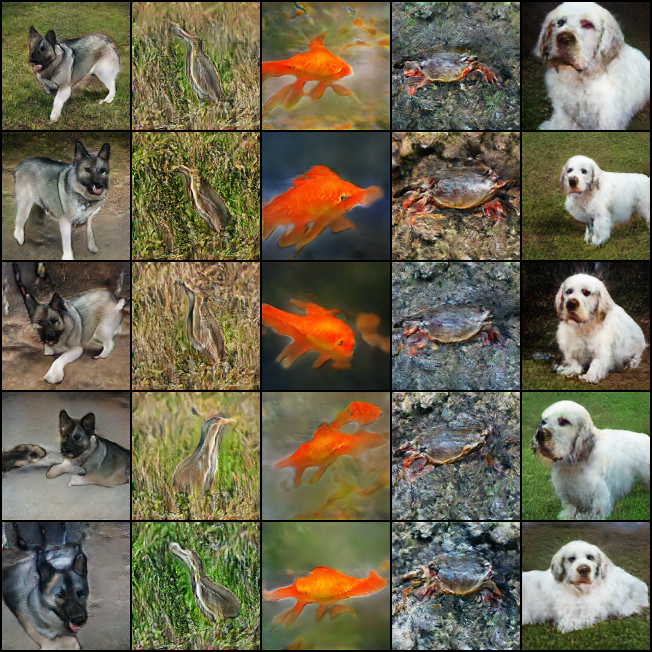

In [ ]:
Image(filename='demo0.05.png')

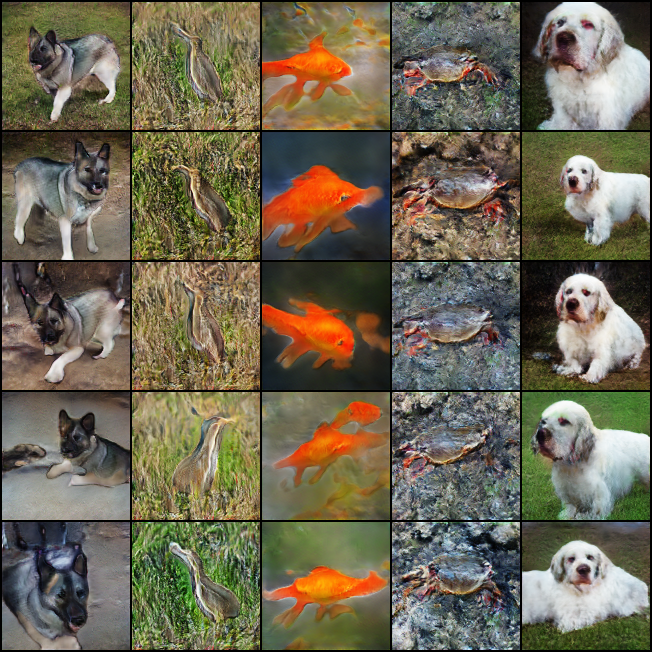

In [ ]:
Image(filename='demo0.1.png')

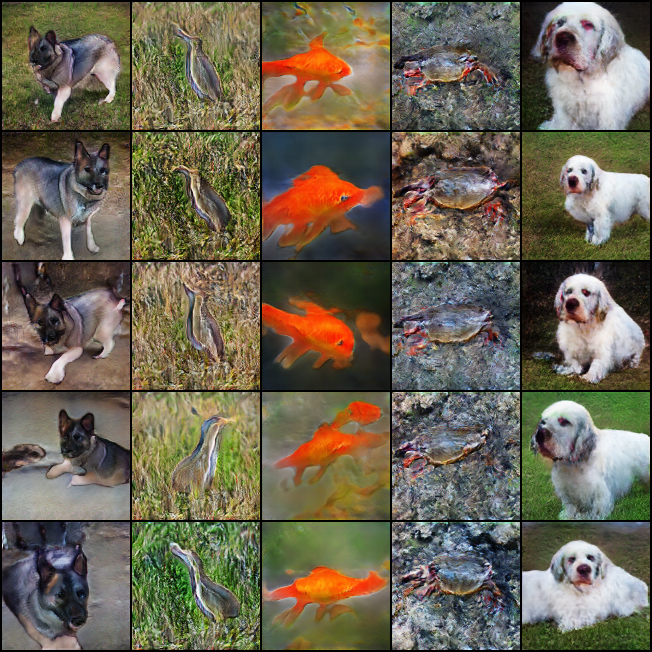

In [ ]:
Image(filename='demo0.15.png')

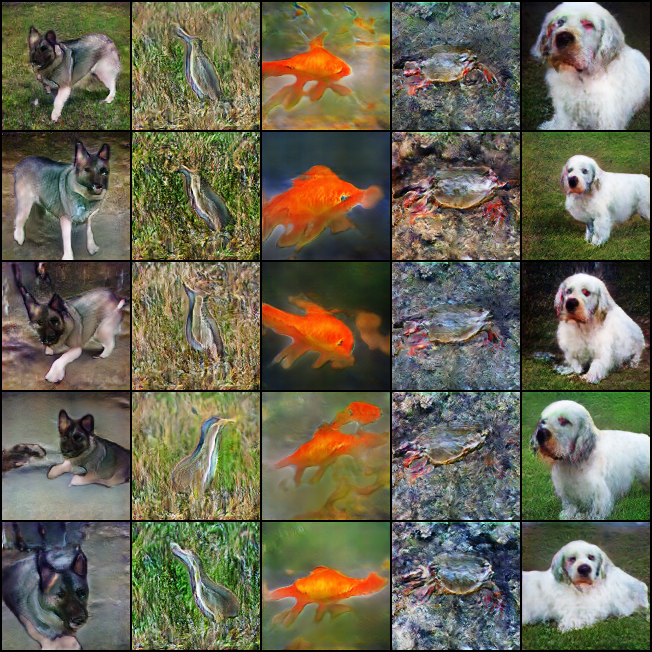

In [ ]:
Image(filename='demo0.2.png')

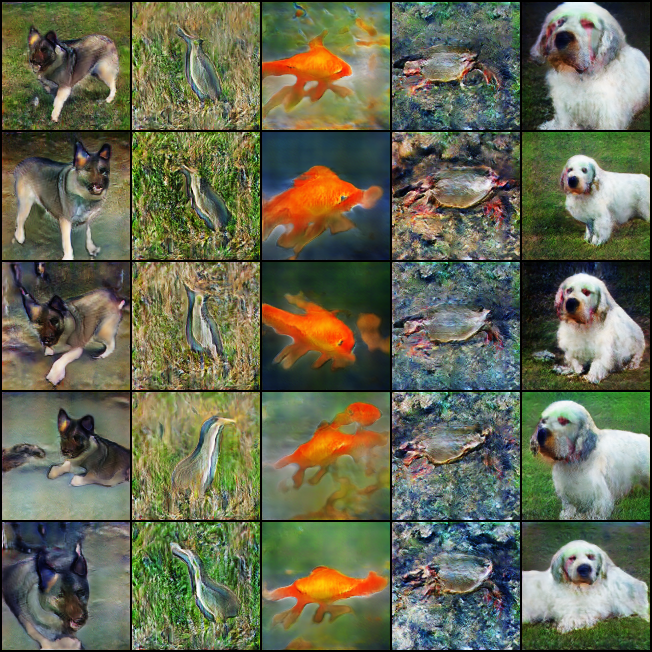

In [ ]:
Image(filename='demo0.25.png')

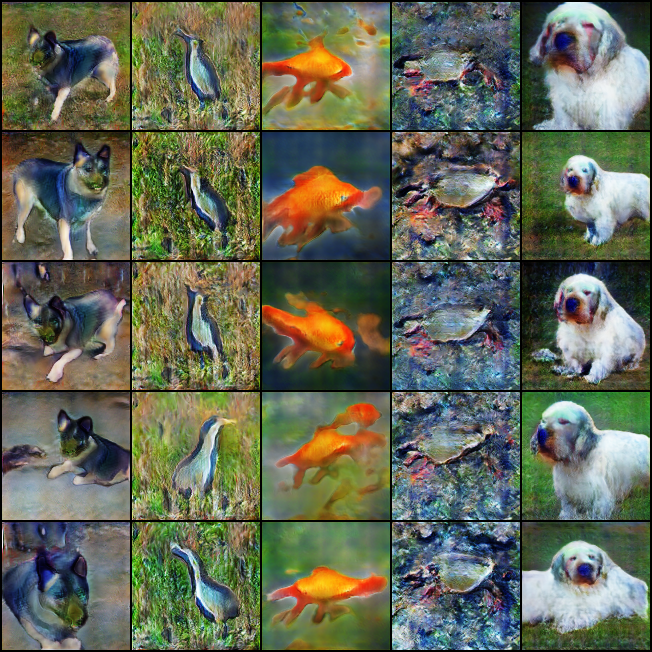

In [ ]:
Image(filename='demo0.3.png')

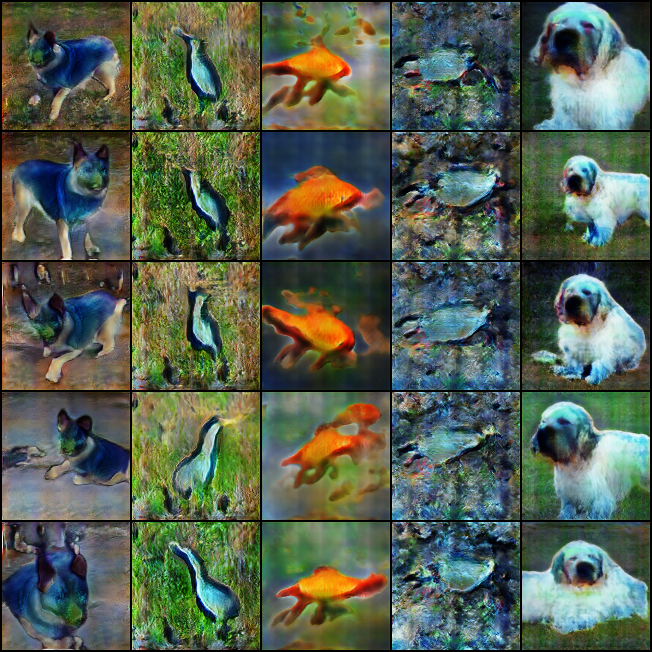

In [ ]:
Image(filename='demo0.35.png')

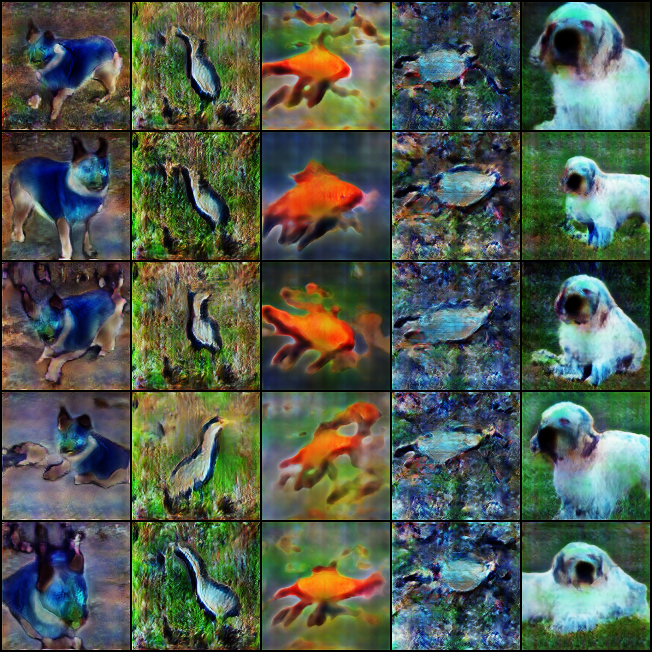

In [ ]:
Image(filename='demo0.4.png')

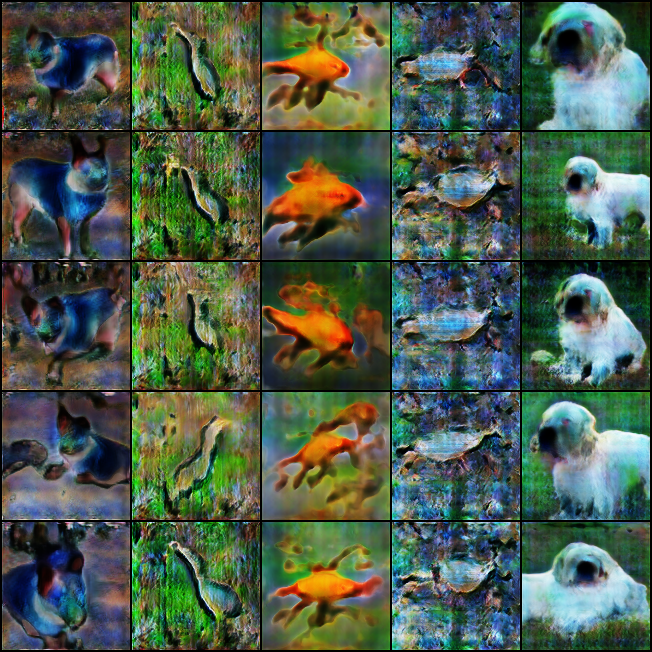

In [ ]:
Image(filename='demo0.45.png')

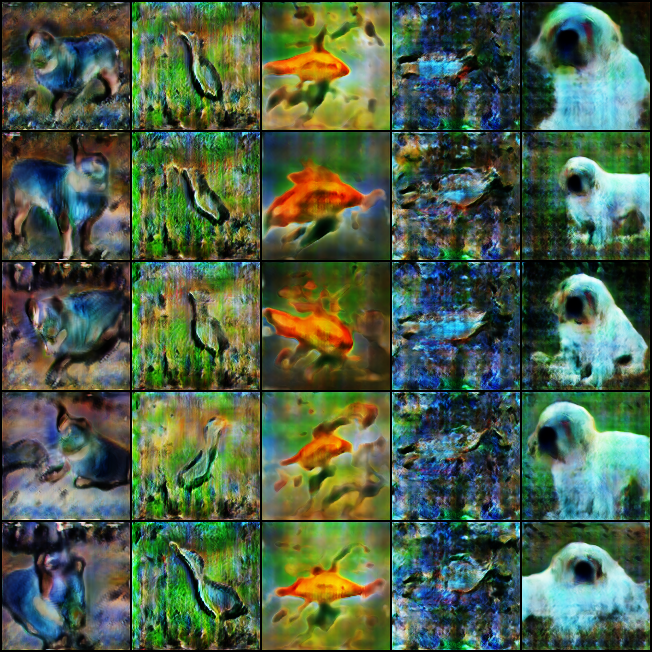

In [ ]:
Image(filename='demo0.5.png')